## Tasks Template Matching:

  * find the template ```data/day6/alignment/templatematching/template2.tif``` in the image ```data/day6/alignment/templatematching/image.tif```


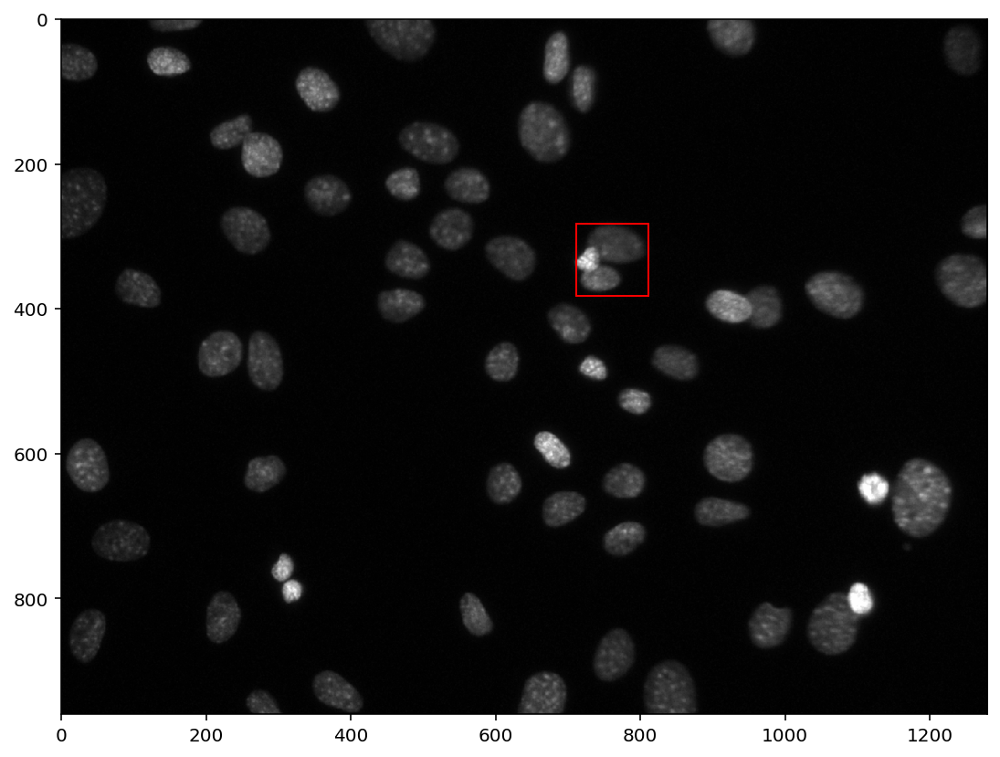

In [25]:
from skimage.io import imread
import matplotlib.pyplot as plt
import numpy as np
from skimage.feature import match_template

# read the images and convert them to floating point (otherwise, filters might generate overflows)
template = imread('data/day6/alignment/templatematching/template2.tif').astype(np.float64)
img = imread('data/day6/alignment/templatematching/image.tif').astype(np.float64)


#plt.figure()
#plt.imshow(img, cmap='gray')

plt.figure()
plt.imshow(template, cmap='gray')

filtered = match_template(img, template, pad_input=True)
#plt.figure()
#plt.imshow(filtered)

max_index = np.argmax(filtered)


coords = np.unravel_index(max_index, img.shape)

#match = img[coords[0]-50:coords[0]+50, coords[1]-50:coords[1]+50]
#plt.figure()
#plt.imshow(match, cmap='gray')

from matplotlib.patches import Rectangle

plt.imshow(img, cmap='gray')

# note that Rectangle uses xy coordinates, but our result is yx
rec = Rectangle([coords[1]-50, coords[0]-50], 100, 100, fill=None, color='red')
plt.gca().add_artist(rec)

We can also use ```match_template``` to find a rotated version of our template by trying multiple rotations and see which one matches best:

  * find the template ```data/day6/alignment/templatematching/template3.tif```. Note that the template has been rotated. You can use ```skimage.transform.rotate``` to generate a rotated version.
  
      * try many rotations (go in 10 degree steps) to find both the location and rotation angle  
      You could use 
      ```python
      num_rotations = 36
      filters = np.zeros((num_rotations,) + img.shape)
      for i, rotation in enumerate(range(0, 360, 10)):
            filters[i] = match_template(img, rotate(template, rotation), pad_input=True)
      ```
      and then find the 3-dimensional maximum in ```filters```. the first dimension should correspond to the rotation angle *index*, the others to the location



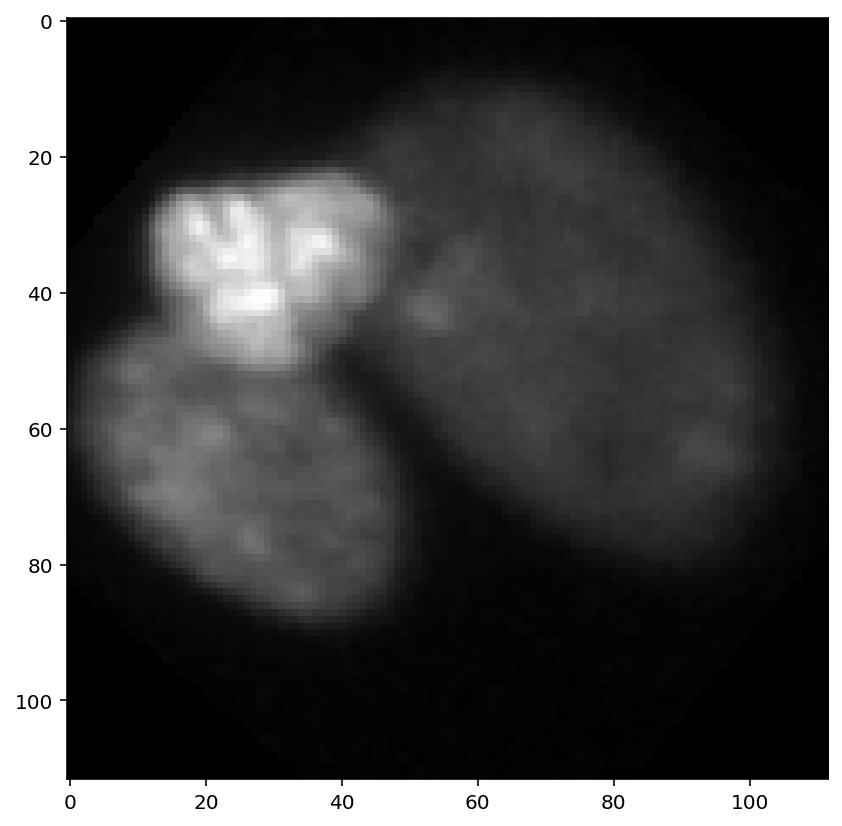

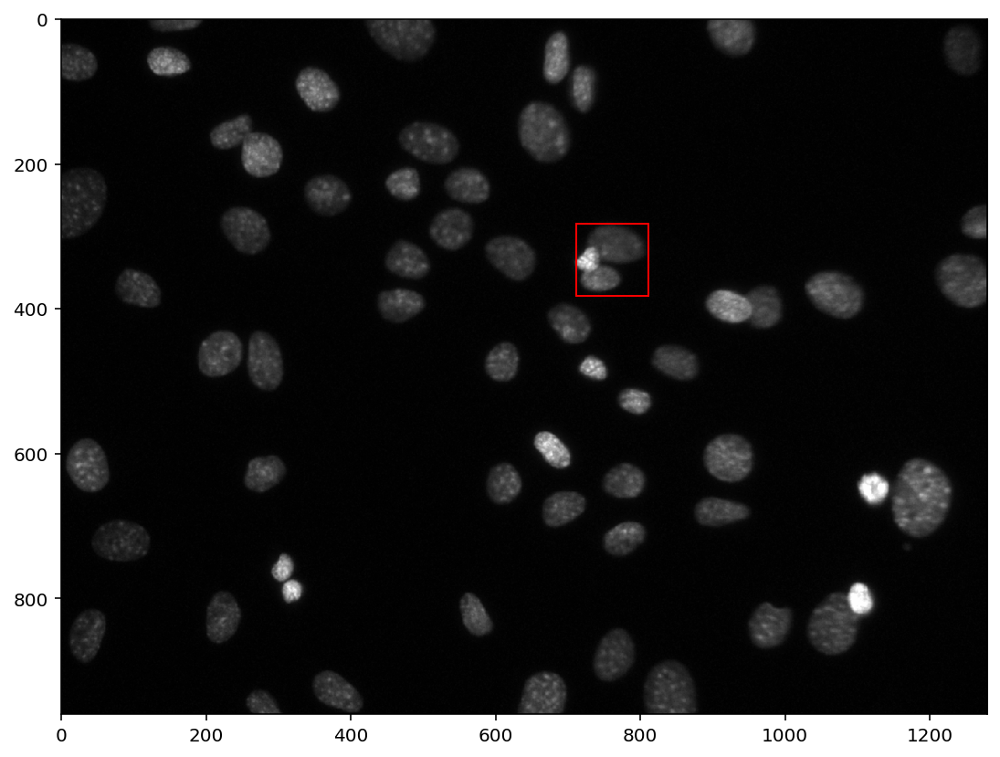

In [36]:
from skimage.io import imread
from  skimage.transform import rotate


template = imread('data/day6/alignment/templatematching/template3.tif').astype(np.float64)
img = imread('data/day6/alignment/templatematching/image.tif').astype(np.float64)

#plt.figure()
#plt.imshow(img, cmap='gray')

plt.figure()
plt.imshow(template, cmap='gray')

max_value = -np.inf
max_index = 0
rotated_time = 0
num_rotations = 36
filters = np.zeros((num_rotations,) + img.shape)
for i, rotation in enumerate(range(0, 360, 10)):
    filters[i] = match_template(img, rotate(template, rotation), pad_input=True)
    temp = np.argmax(filters[i])
    temp_value = np.max(filters[i])
    if temp_value > max_value:
        max_value = temp_value
        max_index = temp
        rotated_time = i


coords = np.unravel_index(max_index, img.shape)


from matplotlib.patches import Rectangle
plt.figure()
plt.imshow(img, cmap='gray')

# note that Rectangle uses xy coordinates, but our result is yx
rec = Rectangle([coords[1]-50, coords[0]-50], 100, 100, fill=None, color='red')
plt.gca().add_artist(rec)


In [34]:
#m = np.argmax(filters)
#np.unravel_index(m, filters.shape)

(4, 332, 761)

## Tasks Stitching
  * calcualte the shift between ```data/day6/alignment/stitching/tile2.tif``` and ```data/day6/alignment/stitching/tile3.tif``` and create a fused image


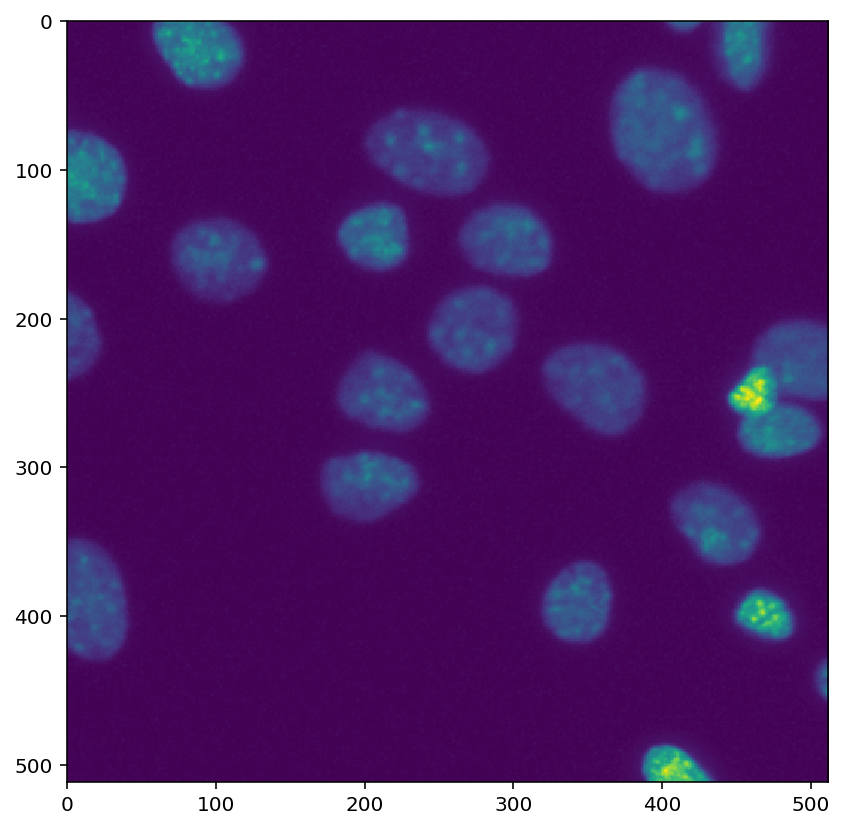

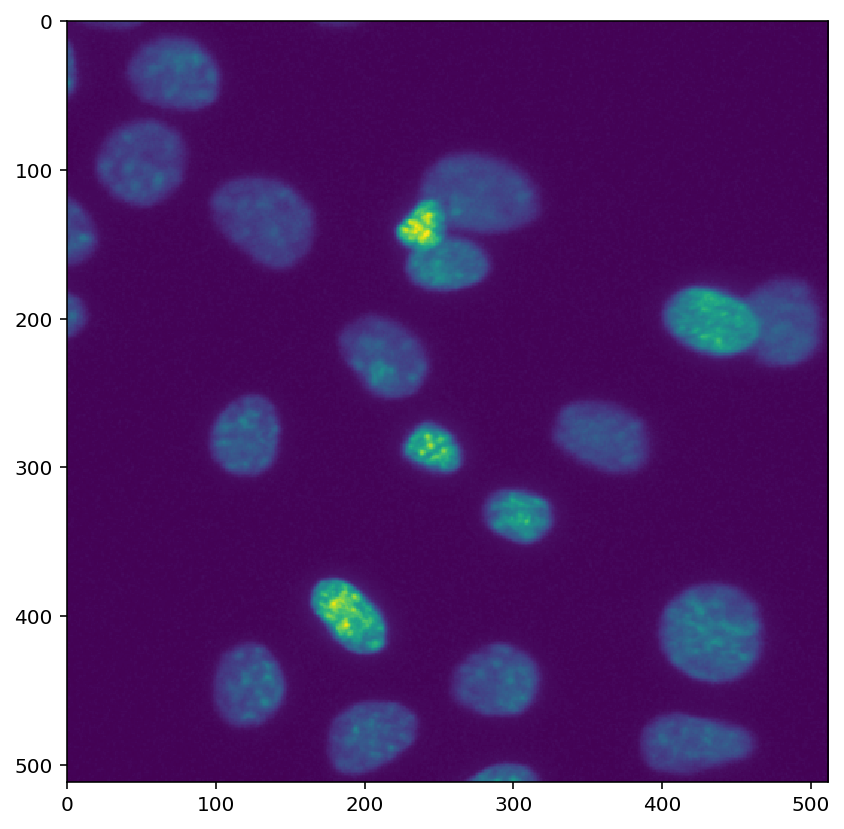

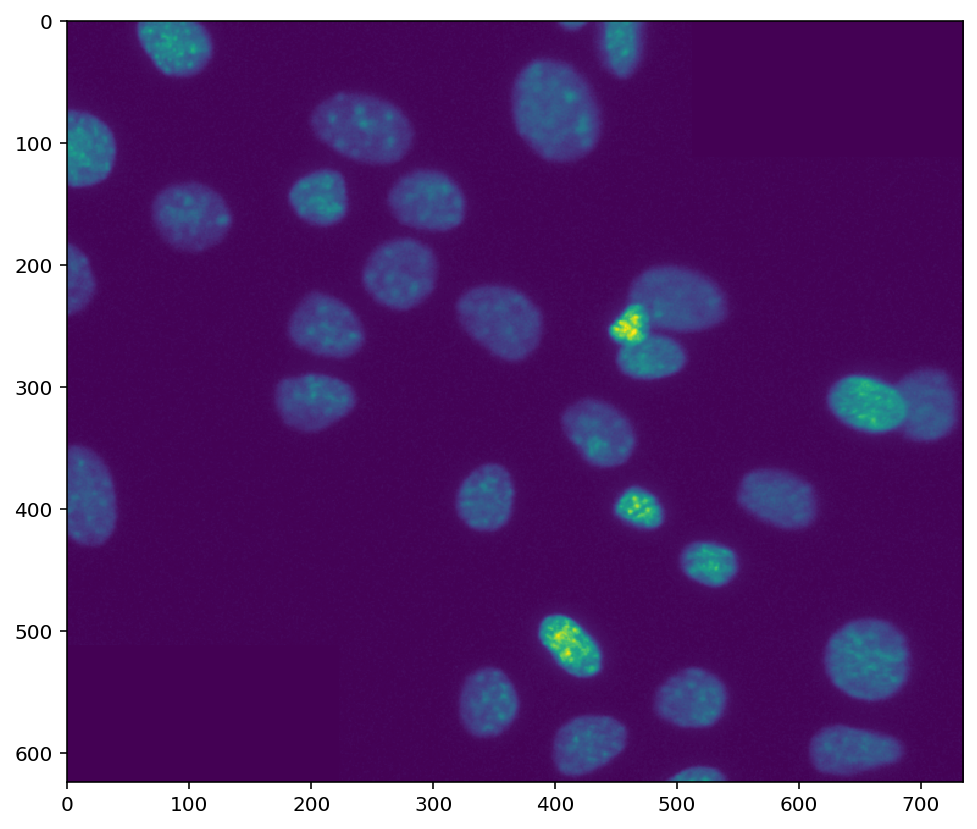

In [5]:
from skimage.io import imread
from  skimage.transform import rotate


img1 = imread('data/day6/alignment/stitching/tile2.tif').astype(np.float64)
img2 = imread('data/day6/alignment/stitching/tile3.tif').astype(np.float64)

plt.figure()
plt.imshow(img1)

plt.figure()
plt.imshow(img2)

from skimage.registration import phase_cross_correlation

shift, corr, _ = phase_cross_correlation(img1, img2)
shift

from skimage.transform import warp, AffineTransform

# construct transform, note that we have to invert the coordinates to xy
at = AffineTransform(translation=shift[::-1])

# warp img2, note that warp requires the inverse of at
transformed = warp(img2, at.inverse)

shift = shift.astype(int) # we will be using this to index into our images, so it has to be int, not float

total_size = np.array(img1.shape) + np.abs(shift)

# get the offset if shift is negative
# np.iinfo(np.int).min gives us the minimal possible integer value
# the folowing code will ignore all shifts > 0 (in which case we do not need to worry about the offset)
offset = -np.clip(shift, np.iinfo(int).min, 0)

# make an empty image
fused = np.zeros(total_size)
weights = np.zeros(total_size)

# construct transform for img1, this is just the offset
tr1 = AffineTransform(translation=offset[::-1])
# construct transform for img2, this is the shift plus the offset (note that you can just concatenate AffineTransforms with +)
tr2 = AffineTransform(translation=offset[::-1]) + AffineTransform(translation=shift[::-1])

# add the images to fused
fused += warp(img1, tr1.inverse, output_shape=total_size)
fused += warp(img2, tr2.inverse, output_shape=total_size)

# add ones as weights in places where the images are fused (Note np.ones_like() creates an image filled with ones with the same size as the input)
weights += warp(np.ones_like(img1), tr1.inverse, output_shape=total_size)
weights += warp(np.ones_like(img2), tr2.inverse, output_shape=total_size)

fused[weights!=0] /= weights[weights!=0]
plt.figure()
plt.imshow(fused)

  * **Optional Challenge:** Use the shifts between tile1.tif, tile2.tif and tile3.tif to fuse all 3 images.
  
  * calculate the shifts between tile1 and tile2 again (see handout), combine the shifts from 1-2 and 2-3 to get the shift from 1-3
  * with the shifts relative to tile 1, calculate the offset in case any of the shifts become negative
  * calculate the size needed for the fused image (size of tile 1 + the maximum absolute value in each dimension)
  * calculate the weighted average fusion as you did with 2 images

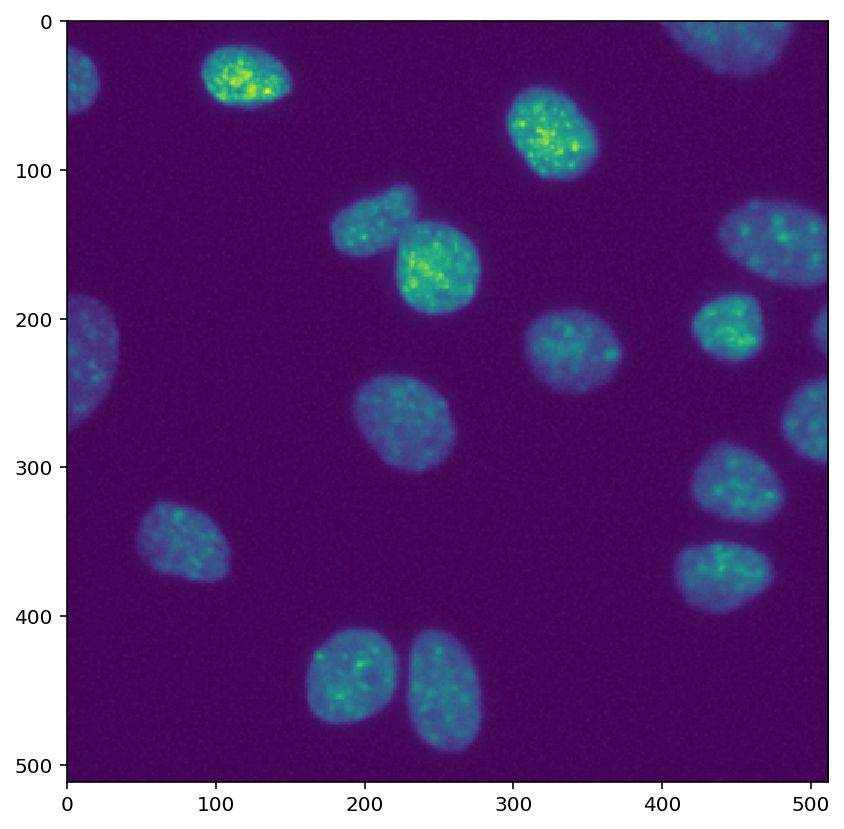

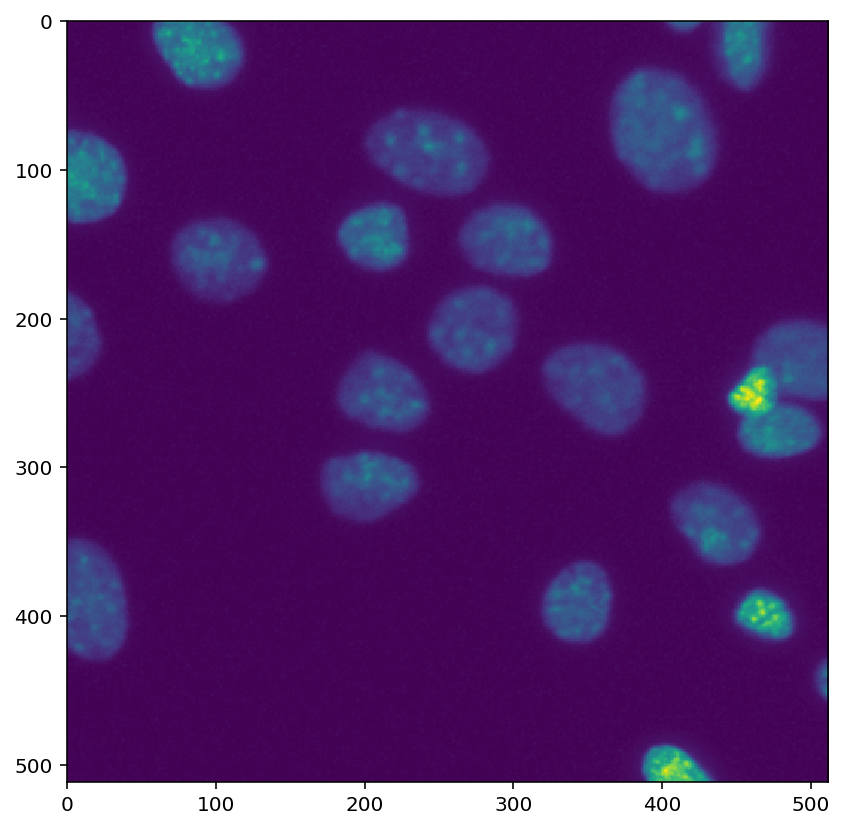

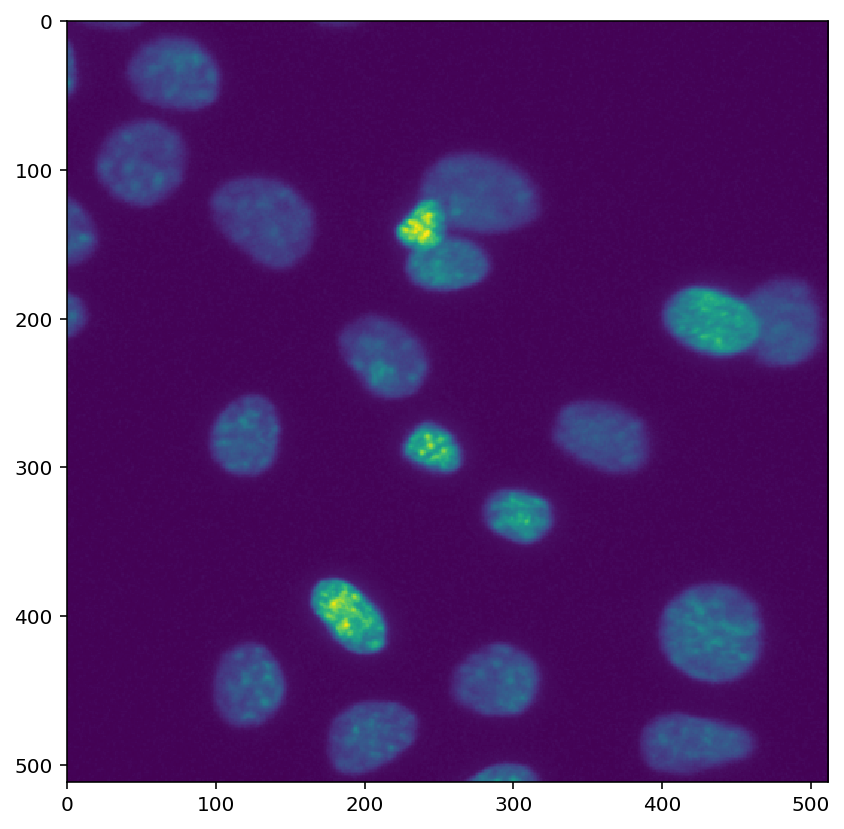

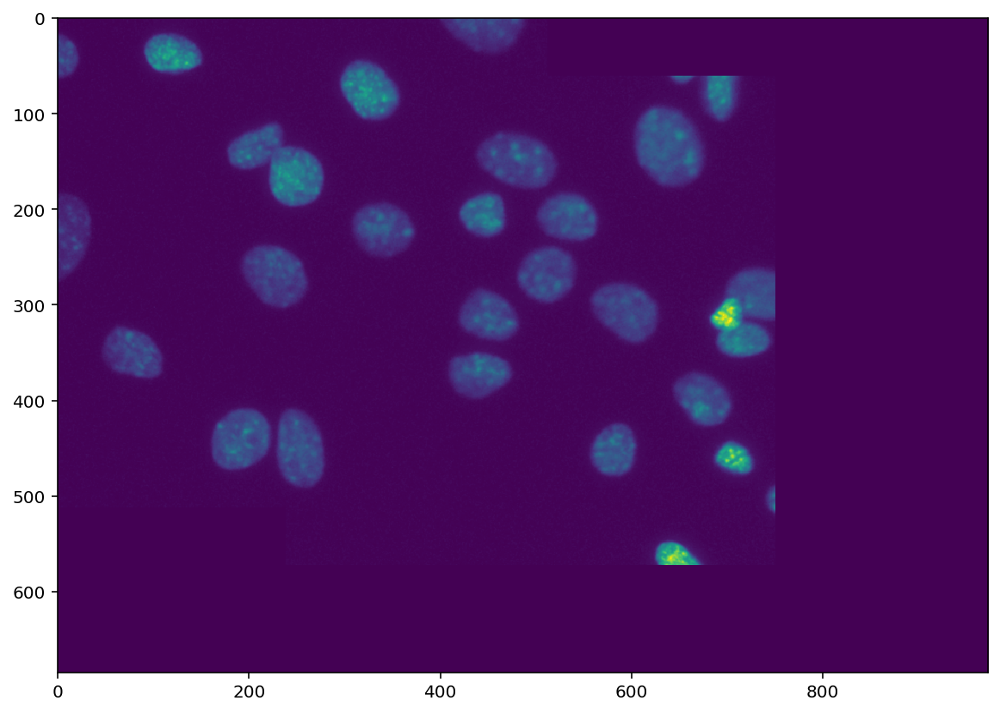

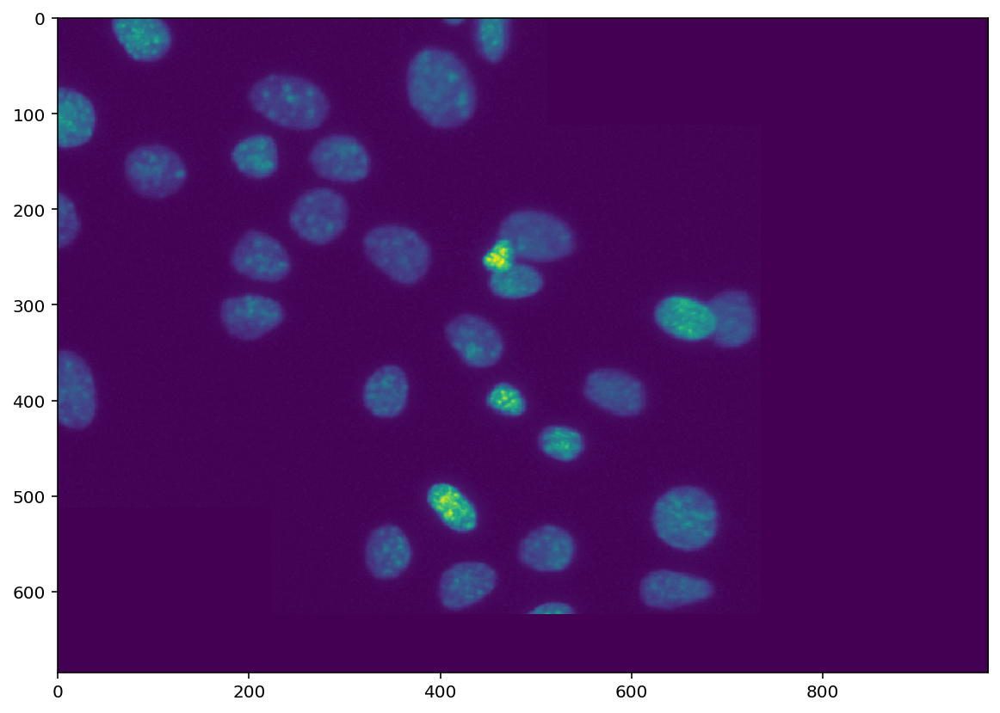

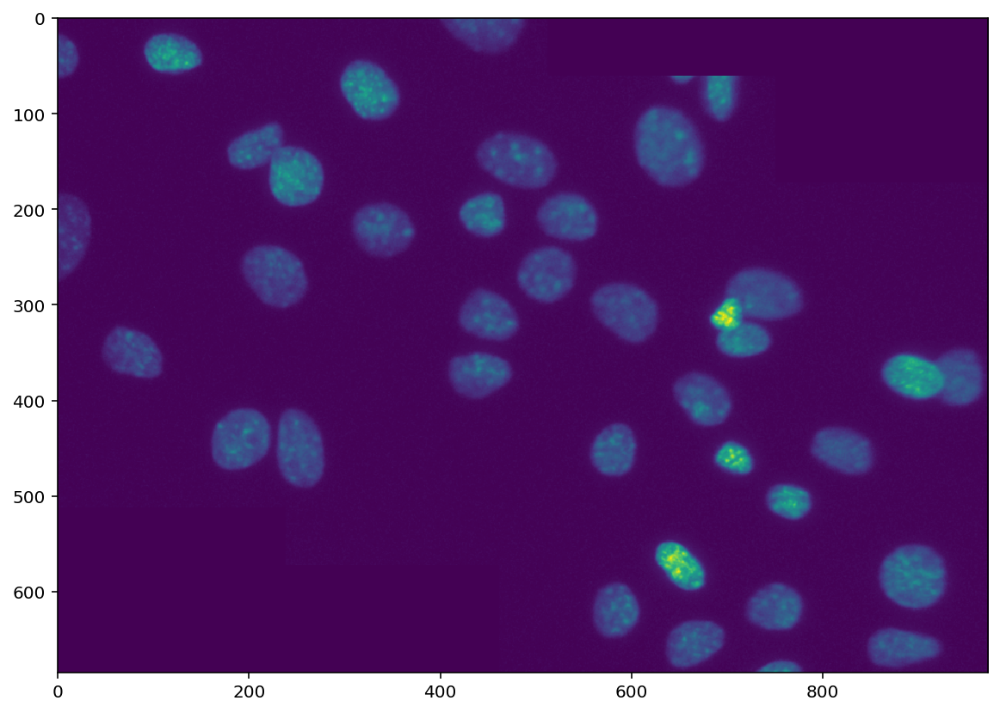

In [37]:
from skimage.io import imread
import matplotlib.pyplot as plt
import numpy as np
from skimage.feature import match_template


img1 = imread('data/day6/alignment/stitching/tile1.tif').astype(np.float64)
img2 = imread('data/day6/alignment/stitching/tile2.tif').astype(np.float64)
img3 = imread('data/day6/alignment/stitching/tile3.tif').astype(np.float64)


plt.figure()
plt.imshow(img1)

plt.figure()
plt.imshow(img2)
plt.figure()
plt.imshow(img3)
from skimage.registration import phase_cross_correlation

shift_1, corr, _ = phase_cross_correlation(img1, img2)

shift_2, corr, _ = phase_cross_correlation(img2, img3)

shift = shift_1 + shift_2
from skimage.transform import warp, AffineTransform
#######################
shift_1 = shift_1.astype(int) # we will be using this to index into our images, so it has to be int, not float
shift = shift.astype(int)
total_size = np.array(img1.shape) + np.abs(shift)

# get the offset if shift is negative
# np.iinfo(np.int).min gives us the minimal possible integer value
# the folowing code will ignore all shifts > 0 (in which case we do not need to worry about the offset)
offset = -np.clip(shift_1, np.iinfo(int).min, 0)

# make an empty image
fused = np.zeros(total_size)
weights_1 = np.zeros(total_size)

# construct transform for img1, this is just the offset
tr1 = AffineTransform(translation=offset[::-1])
# construct transform for img2, this is the shift plus the offset (note that you can just concatenate AffineTransforms with +)
tr2 = AffineTransform(translation=offset[::-1]) + AffineTransform(translation=shift_1[::-1])

# add the images to fused
fused += warp(img1, tr1.inverse, output_shape=total_size)
fused += warp(img2, tr2.inverse, output_shape=total_size)

# add ones as weights in places where the images are fused (Note np.ones_like() creates an image filled with ones with the same size as the input)
weights_1 += warp(np.ones_like(img1), tr1.inverse, output_shape=total_size)
weights_1 += warp(np.ones_like(img2), tr2.inverse, output_shape=total_size)

fused[weights_1!=0] /= weights_1[weights_1!=0]
fused_1 = fused
plt.figure()
plt.imshow(fused_1)
######################

shift_2 = shift_2.astype(int) # we will be using this to index into our images, so it has to be int, not float

total_size = np.array(img1.shape) + np.abs(shift)

# get the offset if shift is negative
# np.iinfo(np.int).min gives us the minimal possible integer value
# the folowing code will ignore all shifts > 0 (in which case we do not need to worry about the offset)
offset = -np.clip(shift_2, np.iinfo(int).min, 0)

# make an empty image
fused = np.zeros(total_size)
weights_2 = np.zeros(total_size)

# construct transform for img1, this is just the offset
tr1 = AffineTransform(translation=offset[::-1])
# construct transform for img2, this is the shift plus the offset (note that you can just concatenate AffineTransforms with +)
tr2 = AffineTransform(translation=offset[::-1]) + AffineTransform(translation=shift_2[::-1])

# add the images to fused
fused += warp(img2, tr1.inverse, output_shape=total_size)
fused += warp(img3, tr2.inverse, output_shape=total_size)

# add ones as weights in places where the images are fused (Note np.ones_like() creates an image filled with ones with the same size as the input)
weights_2 += warp(np.ones_like(img2), tr1.inverse, output_shape=total_size)
weights_2 += warp(np.ones_like(img3), tr2.inverse, output_shape=total_size)

fused[weights_2!=0] /= weights_2[weights_2!=0]
fused_2 = fused


plt.figure()
plt.imshow(fused_2)

#########################

shift_3, corr, _ = phase_cross_correlation(fused_1, fused_2)

shift_3 = shift_3.astype(int) # we will be using this to index into our images, so it has to be int, not float

total_size = np.array(fused_2.shape)

# get the offset if shift is negative
# np.iinfo(np.int).min gives us the minimal possible integer value
# the folowing code will ignore all shifts > 0 (in which case we do not need to worry about the offset)
offset = -np.clip(shift_3, np.iinfo(int).min, 0)

# make an empty image
fused = np.zeros(total_size)
weights = np.zeros(total_size)

# construct transform for img1, this is just the offset
tr1 = AffineTransform(translation=offset[::-1])
# construct transform for img2, this is the shift plus the offset (note that you can just concatenate AffineTransforms with +)
tr2 = AffineTransform(translation=offset[::-1]) + AffineTransform(translation=shift_3[::-1])

# add the images to fused
fused += warp(fused_1, tr1.inverse, output_shape=total_size)
fused += warp(fused_2, tr2.inverse, output_shape=total_size)

# add ones as weights in places where the images are fused (Note np.ones_like() creates an image filled with ones with the same size as the input)
weights += warp(np.ones_like(fused_1), tr1.inverse, output_shape=total_size)
weights += warp(np.ones_like(img3), tr2.inverse, output_shape=total_size)



fused[weights!=0] = fused[weights!=0] / weights[weights!=0]

fused_3 = fused


plt.figure()
plt.imshow(fused_3)

## Tasks Interest Point-based Alignment
In the handout, we have aligned timepoints 1,5 and 10.
Try to align other timepoints of ```data/day6/alignment/timeseries``` and **plot the results**
  * play around with the examples a bit
  * use the coordinates in ```data/day6/alignment/timeseries/cell_coordinates.json``` to align 3 other timepoints of your choice

Text(0.5, 1.0, 'TP 6')

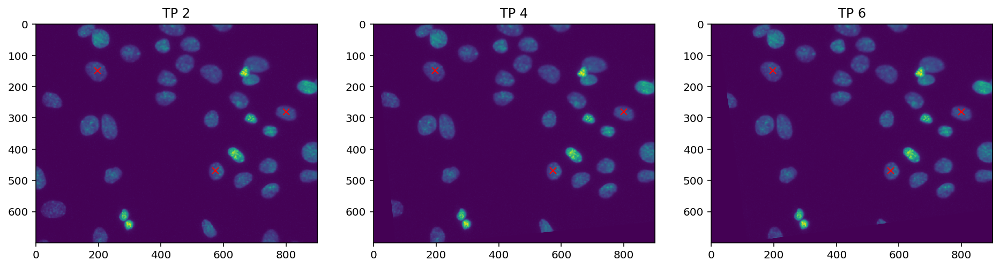

In [6]:
import os
from skimage.io import imread
import matplotlib.pyplot as plt


imgs = []
for f in sorted(os.listdir('data/day6/alignment/timeseries')):
    if f.endswith('.tif'):
        img = imread(os.path.join('data/day6/alignment/timeseries', f))
        imgs.append(img)

import json

with open('data/day6/alignment/timeseries/cell_coordinates.json') as fd:
    coords = json.load(fd)


at2_4 = AffineTransform()
at4_6 = AffineTransform()

# estimate from TP 1 to TP 5
at2_4.estimate(np.array(coords[1]), np.array(coords[3]))

# estimate from TP 5 to TP 10
at4_6.estimate(np.array(coords[3]), np.array(coords[5]))

# 1 to 10: combine both transforms
at2_6 = at2_4 + at4_6

fig, axs = plt.subplots(ncols=3, figsize=(16,4))
axs[0].imshow(imgs[1])
axs[0].plot([p[0] for p in coords[1]], [p[1] for p in coords[1]], 'x', color='red')
axs[0].set_title('TP 2')

# plot tp 5 aligned to first image
# note: we need the transform 1->5 to align 5 to 1 (the inverse of 5->1)
axs[1].imshow(warp(imgs[3], at2_4, clip=False))
# plot coordinates from tp 5 transformed to tp 1: we need inverse of at1_5
axs[1].plot([p[0] for p in at2_4.inverse(coords[3])], [p[1] for p in at2_4.inverse(coords[3])], 'x', color='red')
axs[1].set_title('TP 4')

# plot tp 10 aligned
axs[2].imshow(warp(imgs[5], at2_6, clip=False))
axs[2].plot([p[0] for p in at2_6.inverse(coords[5])], [p[1] for p in at2_6.inverse(coords[5])], 'x', color='red')
axs[2].set_title('TP 6')

* detect fiducial beads in ```data/day6/alignment/timeseries/withbeads``` and use them to align 3 other timepoints of your choice

Text(0.5, 1.0, 'TP 6')

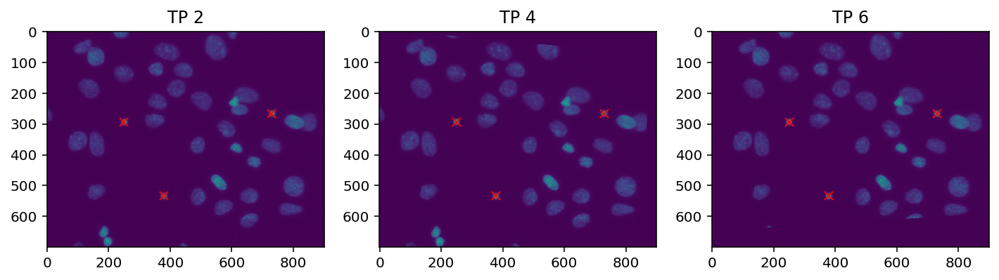

In [5]:
import os

from skimage.io import imread
import numpy as np

import matplotlib.pyplot as plt



imgs = []
for f in sorted(os.listdir('data/day6/alignment/timeseries/withbeads')):
    if f.endswith('.tif'):
        img = imread(os.path.join('data/day6/alignment/timeseries/withbeads', f))
        imgs.append(img.astype(np.float32))

import scipy.ndimage as ndi
from skimage.feature import peak_local_max

# we detect maxima in an inverted Laplacian-of-Gaussian filtered image
# this enhances blobs of a given size
peaks2 = peak_local_max(-ndi.gaussian_laplace(imgs[1], 5), threshold_abs=3)
peaks4 = peak_local_max(-ndi.gaussian_laplace(imgs[3], 5), threshold_abs=3)
peaks6 = peak_local_max(-ndi.gaussian_laplace(imgs[5], 5), threshold_abs=3)



# coordinates are in yx -> invert them to xy
peaks2 = peaks2[:,::-1]
peaks4 = peaks4[:,::-1]
peaks6 = peaks6[:,::-1]


from skimage.transform import warp, AffineTransform
 


at2_4 = AffineTransform()
at4_6 = AffineTransform()

# estimate from TP 1 to TP 5
at2_4.estimate(np.array(peaks2), np.array(peaks4))

# estimate from TP 5 to TP 10
at4_6.estimate(np.array(peaks4), np.array(peaks6))

# 1 to 10: combine both transforms
at2_6 = at2_4 + at4_6



fig, axs = plt.subplots(ncols=3, figsize=(12,4))
axs[0].imshow(imgs[1])
axs[0].plot(peaks2[:,0], peaks2[:,1], 'x', color='red')
axs[0].set_title('TP 2')
axs[1].imshow(warp(imgs[3], at2_4, clip=False))
axs[1].plot([p[0] for p in at2_4.inverse(peaks4)], [p[1] for p in at2_4.inverse(peaks4)], 'x', color='red')
axs[1].set_title('TP 4')
axs[2].imshow(warp(imgs[5], at2_6, clip=False))
axs[2].plot([p[0] for p in at2_6.inverse(peaks6)], [p[1] for p in at2_6.inverse(peaks6)], 'x', color='red')
axs[2].set_title('TP 6')

* Perform descriptor-based alignment on 3 other timepoints in ```data/day6/alignment/timeseries```

Text(0.5, 1.0, 'TP 6')

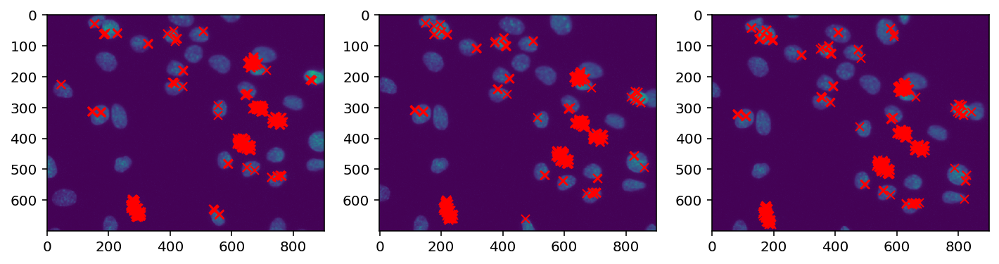

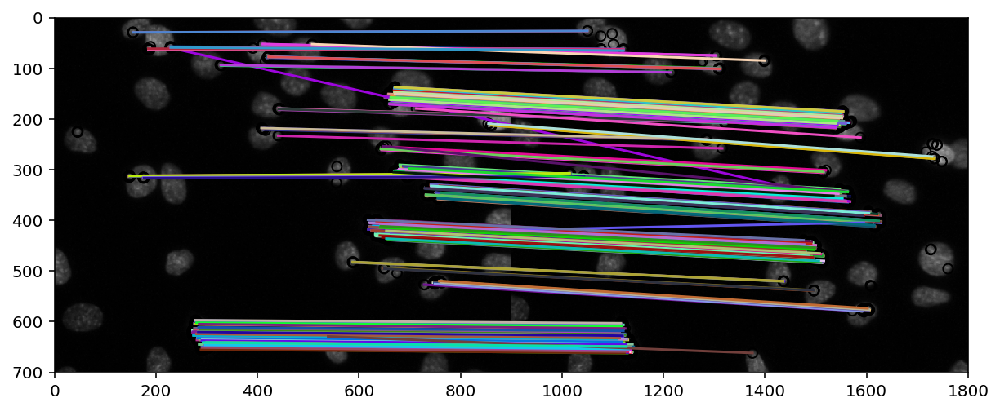

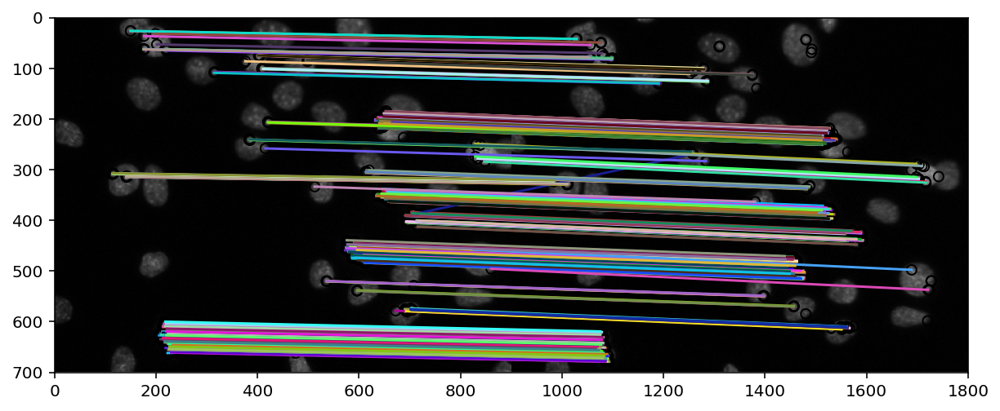

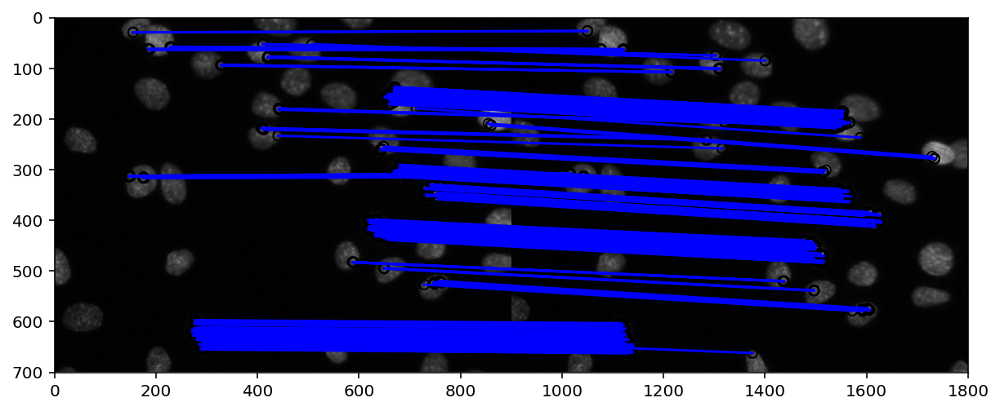

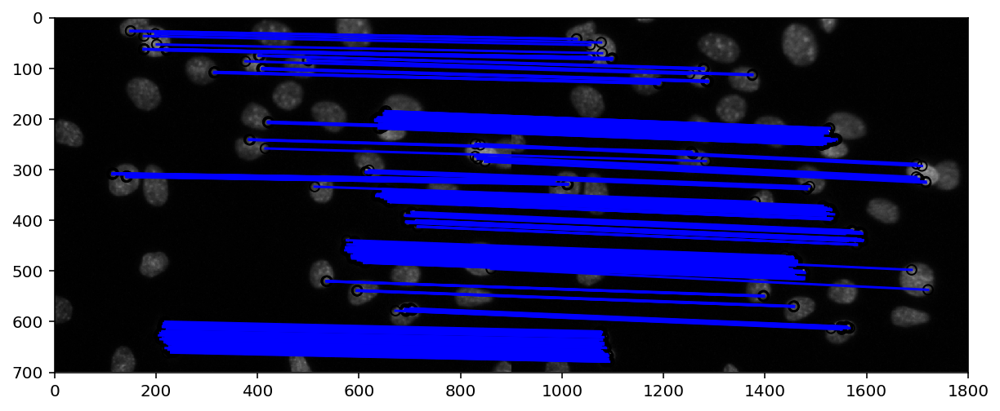

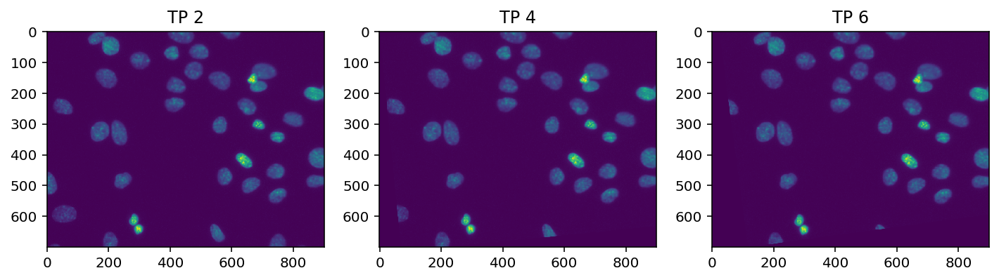

In [27]:
from skimage.feature import ORB
import os
from skimage.io import imread
import matplotlib.pyplot as plt


imgs = []
for f in sorted(os.listdir('data/day6/alignment/timeseries')):
    if f.endswith('.tif'):
        img = imread(os.path.join('data/day6/alignment/timeseries', f))
        imgs.append(img)
        
orb2 = ORB(fast_threshold=0.0005)
orb2.detect_and_extract(imgs[1])

orb4 = ORB(fast_threshold=0.0005)
orb4.detect_and_extract(imgs[3])

orb6 = ORB(fast_threshold=0.0005)
orb6.detect_and_extract(imgs[5])

fig, axs = plt.subplots(ncols=3, figsize=(12,4))
axs[0].imshow(imgs[1])
axs[0].plot(orb2.keypoints[:,1], orb2.keypoints[:,0], 'x', color='red')
axs[1].imshow(imgs[3])
axs[1].plot(orb4.keypoints[:,1], orb4.keypoints[:,0], 'x', color='red')
axs[2].imshow(imgs[5])
axs[2].plot(orb6.keypoints[:,1], orb6.keypoints[:,0], 'x', color='red')



from skimage.feature import match_descriptors, plot_matches

matches_1 = match_descriptors(orb2.descriptors, orb4.descriptors)

plt.figure(figsize=(12,4))
plot_matches(plt.gca(), imgs[1], imgs[3], orb2.keypoints, orb4.keypoints, matches_1)

matches_2 = match_descriptors(orb4.descriptors, orb6.descriptors)

plt.figure(figsize=(12,4))
plot_matches(plt.gca(), imgs[3], imgs[5], orb4.keypoints, orb6.keypoints, matches_2)

keypoints2 = orb2.keypoints[matches_1[:,0]]
keypoints4_1 = orb4.keypoints[matches_1[:,1]]

# flip yx as above
keypoints2 = keypoints2[:,::-1]
keypoints4_1 = keypoints4_1[:,::-1]

keypoints4_2 = orb4.keypoints[matches_2[:,0]]
keypoints6 = orb6.keypoints[matches_2[:,1]]

# flip yx as above
keypoints4_2 = keypoints4_2[:,::-1]
keypoints6 = keypoints6[:,::-1]

from skimage.measure import ransac
from skimage.transform import AffineTransform

# AffineTransform requires 3 corresponding points -> min_samples=3
# with residual_threshold, we can set an upper bound for the error
transform_1, inliers = ransac((keypoints2, keypoints4_1), AffineTransform, min_samples=3, residual_threshold=10)

# get indices of inlying keypoints
inlier_idxs = np.nonzero(inliers)[0]

# plot filtered matches
plt.figure(figsize=(12,4))
plot_matches(plt.gca(), imgs[1], imgs[3], keypoints2[:,::-1], keypoints4_1[:,::-1],
             np.column_stack((inlier_idxs, inlier_idxs)), matches_color='b')

transform, inliers = ransac((keypoints4_2, keypoints6), AffineTransform, min_samples=3, residual_threshold=10)

# get indices of inlying keypoints
inlier_idxs = np.nonzero(inliers)[0]

# plot filtered matches
plt.figure(figsize=(12,4))
plot_matches(plt.gca(), imgs[3], imgs[5], keypoints4_2[:,::-1], keypoints6[:,::-1],
             np.column_stack((inlier_idxs, inlier_idxs)), matches_color='b')

fig, axs = plt.subplots(ncols=3, figsize=(12,4))

axs[0].imshow(imgs[1])
axs[0].set_title('TP 2')
axs[1].imshow(warp(imgs[3], transform_1, clip=False))
axs[1].set_title('TP 4')
axs[2].imshow(warp(imgs[5], transform+transform_1, clip=False))
axs[2].set_title('TP 6')

## OPTIONAL: some more practice on other images



```data/day6/alignment/timeseries2``` contains 10 timepoints of shifted images from another sample of DAPI-stained nuclei.  

Find a strategy to align 3 timepoints of your choice. You can:

* Manually select nuclei
* Use ORB+RANSAC descriptor-based registration
* The shifts consist almost entirely of translations, so you could also use ```register_translation``` to align them



Text(0.5, 1.0, 'TP 6')

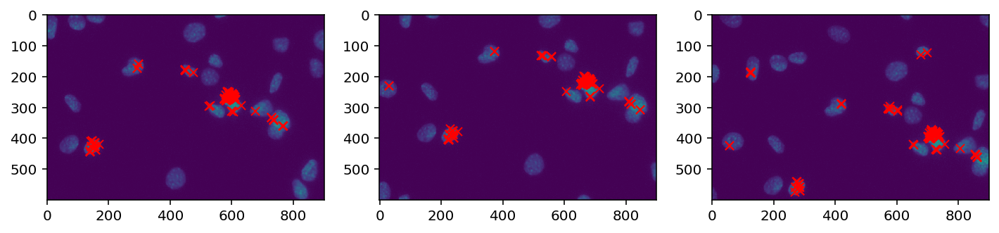

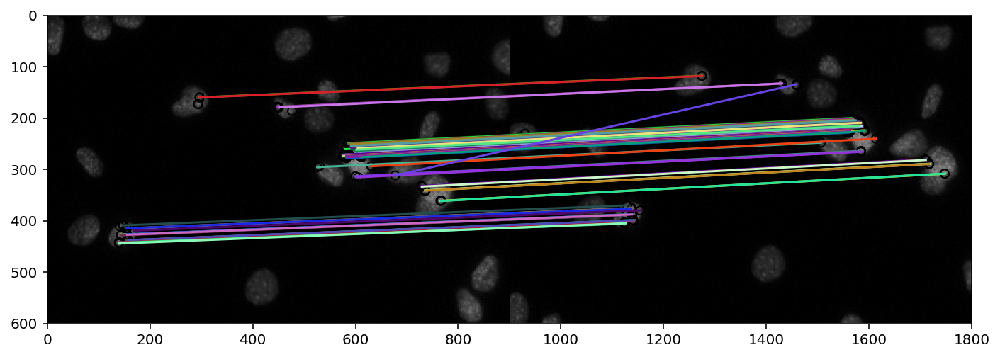

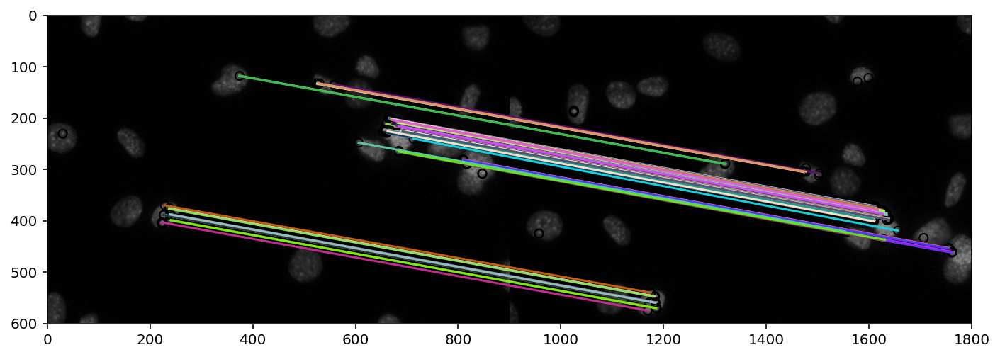

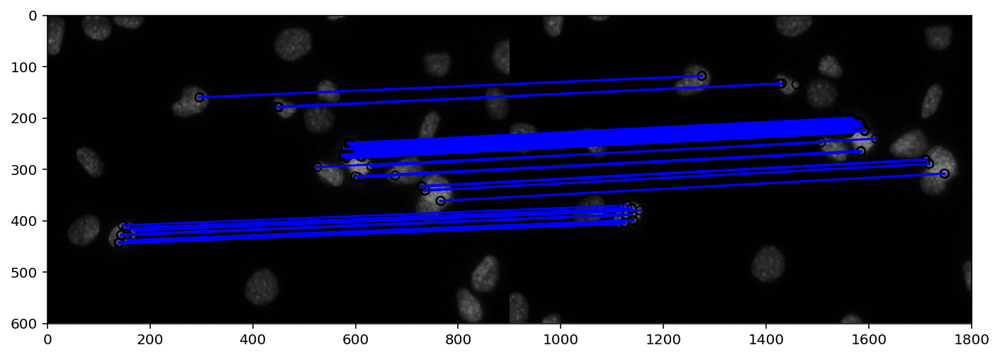

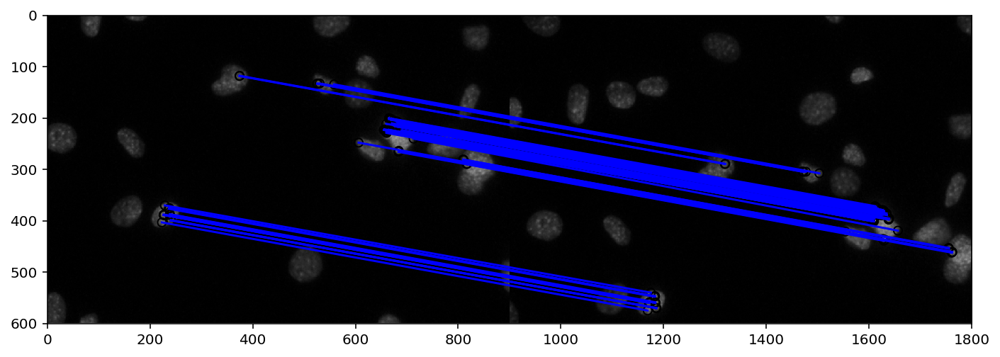

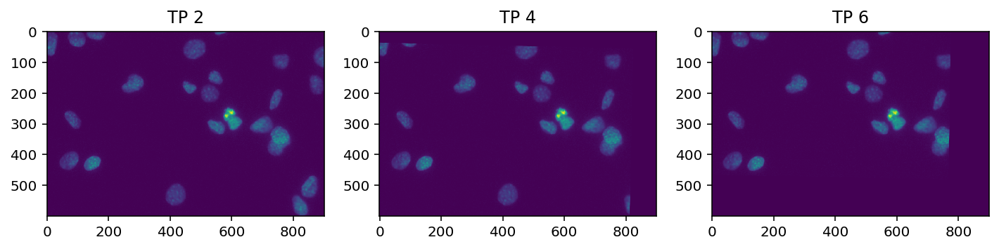

In [25]:
import os
from skimage.io import imread

imgs = []
for f in sorted(os.listdir('data/day6/alignment/timeseries2')):
    if f.endswith('.tif'):
        img = imread(os.path.join('data/day6/alignment/timeseries2', f))
        imgs.append(img)
orb2 = ORB(fast_threshold=0.0005)
orb2.detect_and_extract(imgs[1])

orb4 = ORB(fast_threshold=0.0005)
orb4.detect_and_extract(imgs[3])

orb6 = ORB(fast_threshold=0.0005)
orb6.detect_and_extract(imgs[5])

fig, axs = plt.subplots(ncols=3, figsize=(12,4))
axs[0].imshow(imgs[1])
axs[0].plot(orb2.keypoints[:,1], orb2.keypoints[:,0], 'x', color='red')
axs[1].imshow(imgs[3])
axs[1].plot(orb4.keypoints[:,1], orb4.keypoints[:,0], 'x', color='red')
axs[2].imshow(imgs[5])
axs[2].plot(orb6.keypoints[:,1], orb6.keypoints[:,0], 'x', color='red')



from skimage.feature import match_descriptors, plot_matches

matches_1 = match_descriptors(orb2.descriptors, orb4.descriptors)

plt.figure(figsize=(12,4))
plot_matches(plt.gca(), imgs[1], imgs[3], orb2.keypoints, orb4.keypoints, matches_1)

matches_2 = match_descriptors(orb4.descriptors, orb6.descriptors)

plt.figure(figsize=(12,4))
plot_matches(plt.gca(), imgs[3], imgs[5], orb4.keypoints, orb6.keypoints, matches_2)

keypoints2 = orb2.keypoints[matches_1[:,0]]
keypoints4_1 = orb4.keypoints[matches_1[:,1]]

# flip yx as above
keypoints2 = keypoints2[:,::-1]
keypoints4_1 = keypoints4_1[:,::-1]

keypoints4_2 = orb4.keypoints[matches_2[:,0]]
keypoints6 = orb6.keypoints[matches_2[:,1]]

# flip yx as above
keypoints4_2 = keypoints4_2[:,::-1]
keypoints6 = keypoints6[:,::-1]

from skimage.measure import ransac
from skimage.transform import AffineTransform

# AffineTransform requires 3 corresponding points -> min_samples=3
# with residual_threshold, we can set an upper bound for the error
transform_1, inliers = ransac((keypoints2, keypoints4_1), AffineTransform, min_samples=3, residual_threshold=10)

# get indices of inlying keypoints
inlier_idxs = np.nonzero(inliers)[0]

# plot filtered matches
plt.figure(figsize=(12,4))
plot_matches(plt.gca(), imgs[1], imgs[3], keypoints2[:,::-1], keypoints4_1[:,::-1],
             np.column_stack((inlier_idxs, inlier_idxs)), matches_color='b')

transform, inliers = ransac((keypoints4_2, keypoints6), AffineTransform, min_samples=3, residual_threshold=10)

# get indices of inlying keypoints
inlier_idxs = np.nonzero(inliers)[0]

# plot filtered matches
plt.figure(figsize=(12,4))
plot_matches(plt.gca(), imgs[3], imgs[5], keypoints4_2[:,::-1], keypoints6[:,::-1],
             np.column_stack((inlier_idxs, inlier_idxs)), matches_color='b')


fig, axs = plt.subplots(ncols=3, figsize=(12,4))

axs[0].imshow(imgs[1])
axs[0].set_title('TP 2')
axs[1].imshow(warp(imgs[3], transform_1, clip=False))
axs[1].set_title('TP 4')
axs[2].imshow(warp(imgs[5], transform+transform_1, clip=False))
axs[2].set_title('TP 6')

```data/day6/alignment/timeseries3_withbeads``` contains 10 timepoints of shifted images from another sample of DAPI-stained nuclei, this time with 5 fiducial beads. 

* Align 3 timepoints of your choice and align them by detecting the beads and registering the coordinates.



Text(0.5, 1.0, 'TP 6')

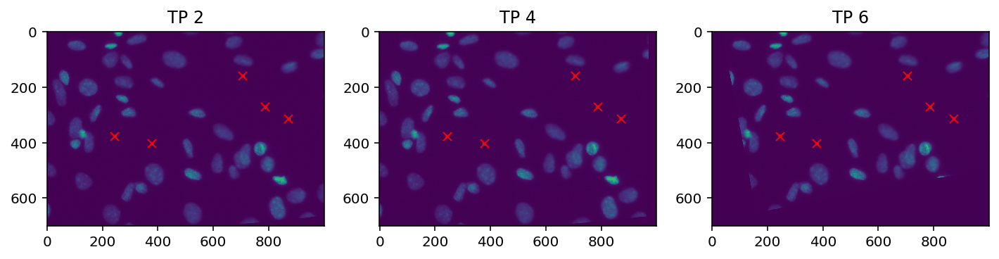

In [23]:
import os

from skimage.io import imread
import numpy as np

import matplotlib.pyplot as plt



imgs = []
for f in sorted(os.listdir('data/day6/alignment/timeseries3_withbeads')):
    if f.endswith('.tif'):
        img = imread(os.path.join('data/day6/alignment/timeseries3_withbeads', f))
        imgs.append(img.astype(np.float32))

import scipy.ndimage as ndi
from skimage.feature import peak_local_max

# we detect maxima in an inverted Laplacian-of-Gaussian filtered image
# this enhances blobs of a given size
peaks2 = peak_local_max(-ndi.gaussian_laplace(imgs[1], 5), threshold_abs=3)
peaks4 = peak_local_max(-ndi.gaussian_laplace(imgs[3], 5), threshold_abs=3)
peaks6 = peak_local_max(-ndi.gaussian_laplace(imgs[5], 5), threshold_abs=3)



# coordinates are in yx -> invert them to xy
peaks2 = peaks2[:,::-1]
peaks4 = peaks4[:,::-1]
peaks6 = peaks6[:,::-1]


from skimage.transform import warp, AffineTransform



at2_4 = AffineTransform()

# estimate from TP 1 to TP 5
at2_4.estimate(np.array(peaks2), np.array(peaks4))


orb2 = ORB(fast_threshold=0.0005)
orb2.detect_and_extract(imgs[1])

orb6 = ORB(fast_threshold=0.0005)
orb6.detect_and_extract(imgs[5])


from skimage.feature import match_descriptors, plot_matches

matches_1 = match_descriptors(orb2.descriptors, orb6.descriptors)

keypoints2 = orb2.keypoints[matches_1[:,0]]
keypoints6 = orb6.keypoints[matches_1[:,1]]

# flip yx as above
keypoints2 = keypoints2[:,::-1]
keypoints6 = keypoints6[:,::-1]

from skimage.measure import ransac
from skimage.transform import AffineTransform

# AffineTransform requires 3 corresponding points -> min_samples=3
# with residual_threshold, we can set an upper bound for the error
transform, inliers = ransac((keypoints2, keypoints6), AffineTransform, min_samples=3, residual_threshold=10)





axs[0].imshow(imgs[1])
axs[0].plot(peaks2[:,0], peaks2[:,1], 'x', color='red')
axs[0].set_title('TP 2')
axs[1].imshow(warp(imgs[3], at2_4, clip=False))
axs[1].plot([p[0] for p in at2_4.inverse(peaks4)], [p[1] for p in at2_4.inverse(peaks4)], 'x', color='red')
axs[1].set_title('TP 4')
axs[2].imshow(warp(imgs[5], transform, clip=False))
axs[2].plot([p[0] for p in transform.inverse(peaks6)], [p[1] for p in transform.inverse(peaks6)], 'x', color='red')
axs[2].set_title('TP 6')